# 二項係数で遊んでみよう

黒木玄

2018-09-03

* Copyright 2018 Gen Kuroki
* License: MIT https://opensource.org/licenses/MIT
* Repository: https://github.com/genkuroki/RecreationalMath/tree/master/MF2018

このファイルは次の場所でよりきれいに閲覧できる:

* <a href="http://nbviewer.jupyter.org/github/genkuroki/RecreationalMath/blob/master/MF2018/binomial.ipynb?flush_cache=true">nbviewer</a>

**内容:** mod m での二項係数表のフラクタル構造に注目. 二項係数を

$$
\binom{n}{k} = {}_nC_k = \frac{n!}{k!(n-k)!}
$$

と書く. 歴史的には $\binom{n}{k}$ の記号法の方が古くて現在でも標準的である. 二項係数はPascalの三角形を使って求めることができる. その $m$ で割った余りの表を眺めると繰り返し模様(フラクタル構造)が見える. どうしてそういうことになるのだろうか? ($m$ で割った余りで考えることを modulo $m$ で考えるという.) 

**ヒント:** <a href="https://www.google.co.jp/search?q=Lucas%E3%81%AE%E5%AE%9A%E7%90%86">Lucasの定理</a>について理解できれば, 素数 $p$ に対する modulo $p$ で計算した二項係数表のフラクタル構造について理解できるだろう.

**関連ウェブサイト:**

* http://orion.math.iastate.edu/reu/oldREU/modupasc.htm
* http://math.a.la9.jp/pascalt.htm
* http://integers.hatenablog.com/entry/2016/08/02/230537

**Julia言語:** <a href="https://www.google.co.jp/search?q=Julialang">Julia言語</a>のインストールについては

* <a href="http://nbviewer.jupyter.org/gist/genkuroki/81de23edcae631a995e19a2ecf946a4f">WindowsへのJulia言語のインストール</a>

を参照. このノートブックでは v0.6.4 を使用している. その理由は v1.0.0 はこれを書いている時点で Windows 上の Jupyter で利用できないから.

$
\newcommand\eps{\varepsilon}
\newcommand\ds{\displaystyle}
\newcommand\Z{{\mathbb Z}}
\newcommand\R{{\mathbb R}}
\newcommand\C{{\mathbb C}}
\newcommand\T{{\mathbb T}}
\newcommand\QED{\text{□}}
\newcommand\root{\sqrt}
\newcommand\bra{\langle}
\newcommand\ket{\rangle}
\newcommand\d{\partial}
\newcommand\sech{\operatorname{sech}}
\newcommand\cosec{\operatorname{cosec}}
\newcommand\sign{\operatorname{sign}}
\newcommand\sinc{\operatorname{sinc}}
\newcommand\arctanh{\operatorname{arctanh}}
\newcommand\sn{\operatorname{sn}}
\newcommand\cn{\operatorname{cn}}
\newcommand\cd{\operatorname{cd}}
\newcommand\dn{\operatorname{dn}}
\newcommand\real{\operatorname{Re}}
\newcommand\imag{\operatorname{Im}}
\newcommand\Li{\operatorname{Li}}
\newcommand\np[1]{:\!#1\!:}
\newcommand\PROD{\mathop{\coprod\kern-1.35em\prod}}
$

<h1>目次<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#二項係数表をPascalの三角形で計算するアルゴリズム" data-toc-modified-id="二項係数表をPascalの三角形で計算するアルゴリズム-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>二項係数表をPascalの三角形で計算するアルゴリズム</a></span></li><li><span><a href="#プロット" data-toc-modified-id="プロット-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>プロット</a></span><ul class="toc-item"><li><span><a href="#modulo-2,-4,-8,-..." data-toc-modified-id="modulo-2,-4,-8,-...-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>modulo 2, 4, 8, ...</a></span></li><li><span><a href="#modulo-3,-9,-..." data-toc-modified-id="modulo-3,-9,-...-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>modulo 3, 9, ...</a></span></li><li><span><a href="#modulo-5,-25,-..." data-toc-modified-id="modulo-5,-25,-...-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>modulo 5, 25, ...</a></span></li><li><span><a href="#modolo-6,-10,-12,-14,-18" data-toc-modified-id="modolo-6,-10,-12,-14,-18-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>modolo 6, 10, 12, 14, 18</a></span></li></ul></li><li><span><a href="#Lucasの定理" data-toc-modified-id="Lucasの定理-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Lucasの定理</a></span></li><li><span><a href="#二項係数の漸近挙動" data-toc-modified-id="二項係数の漸近挙動-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>二項係数の漸近挙動</a></span></li><li><span><a href="#おまけ：数や階乗や二項係数の一般化" data-toc-modified-id="おまけ：数や階乗や二項係数の一般化-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>おまけ：数や階乗や二項係数の一般化</a></span></li></ul></div>

In [1]:
endof(a) = lastindex(a)
using SpecialFunctions
using Printf
const e = ℯ

using Plots
gr(color=:rainbow, size=(400, 300), aspect_ratio=1, titlefontsize=10)
ENV["PLOTS_TEST"] = "true"
clibrary(:colorcet)

using SymPy

## 二項係数表をPascalの三角形で計算するアルゴリズム

$$
z[x+1,y+1] = \binom{x+y}{x} = \binom{x+y-1}{x-1} + \binom{x+y-1}{x} = z[x,y+1] + z[x+1,y]
$$

$$
0 \leqq n - x \leqq N \iff -n \leqq -x \leqq N-n \iff n-N\leqq x \leqq n
$$

In [2]:
safemod(x, m) = iszero(m) ? x : mod(x, m)

function bctable(; modulo = 0, tablesize = 5)
    m, N = modulo, tablesize
    z = ones(Int, N+1, N+1)
    for n in 2:2N
        for x in max(1,n-N):min(n-1,N)
            y = n - x
            z[x+1, y+1] = safemod(z[x,y+1] + z[x+1,y], m)
        end
    end
    return z
end

function plotbctable(; modulo = 0, tablesize = 5, kwargs...)
    heatmap(0:tablesize, 0:tablesize, bctable(modulo=modulo, tablesize=tablesize); kwargs...)
end

plotbctable (generic function with 1 method)

In [3]:
# 左上の (1,1) 成分が binom(0,0)
# 左上から右下にPascalの三角形の計算を実行している.

bctable(modulo=0, tablesize=10)

11×11 Array{Int64,2}:
 1   1   1    1     1     1     1      1      1      1       1
 1   2   3    4     5     6     7      8      9     10      11
 1   3   6   10    15    21    28     36     45     55      66
 1   4  10   20    35    56    84    120    165    220     286
 1   5  15   35    70   126   210    330    495    715    1001
 1   6  21   56   126   252   462    792   1287   2002    3003
 1   7  28   84   210   462   924   1716   3003   5005    8008
 1   8  36  120   330   792  1716   3432   6435  11440   19448
 1   9  45  165   495  1287  3003   6435  12870  24310   43758
 1  10  55  220   715  2002  5005  11440  24310  48620   92378
 1  11  66  286  1001  3003  8008  19448  43758  92378  184756

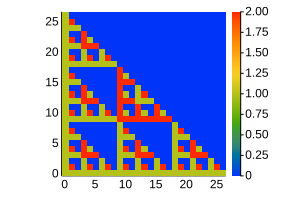

In [4]:
# 左下が binom(0,0) = 0
# 左下から右上にPascalの三角形を計算している.
# 色は 3 で割った余りを表している.

plotbctable(modulo=3, tablesize=26, size=(300,200))

## プロット

### modulo 2, 4, 8, ...

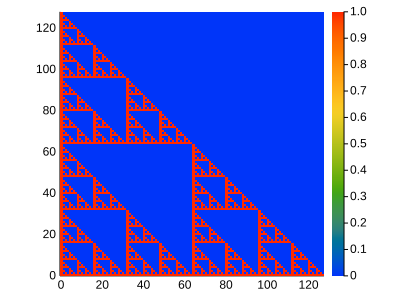

In [5]:
plotbctable(modulo=2, tablesize=127)

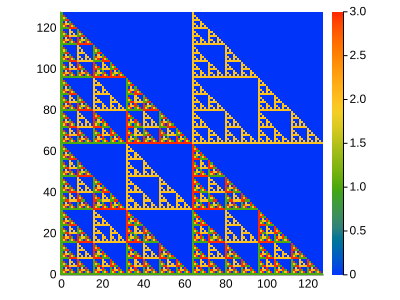

In [6]:
plotbctable(modulo=4, tablesize=127)

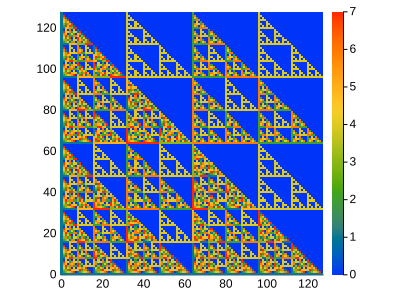

In [7]:
plotbctable(modulo=8, tablesize=127)

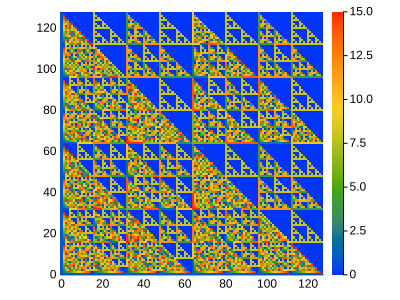

In [8]:
plotbctable(modulo=16, tablesize=127)

### modulo 3, 9, ...

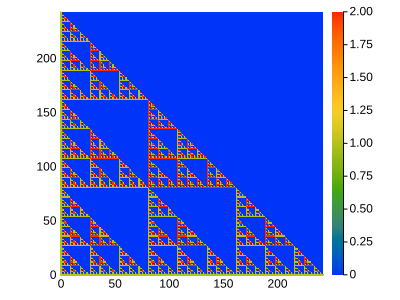

In [9]:
plotbctable(modulo=3, tablesize=242)

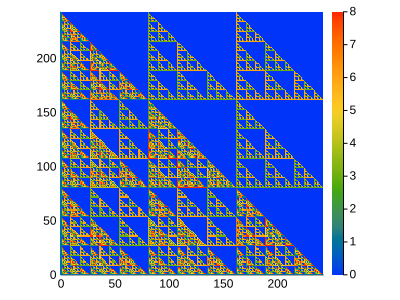

In [10]:
plotbctable(modulo=9, tablesize=242)

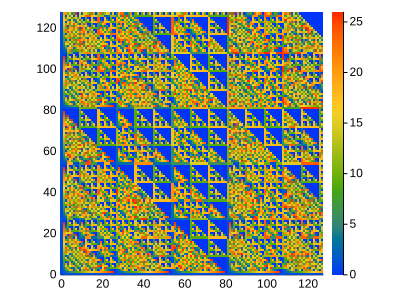

In [11]:
plotbctable(modulo=27, tablesize=127)

### modulo 5, 25, ...

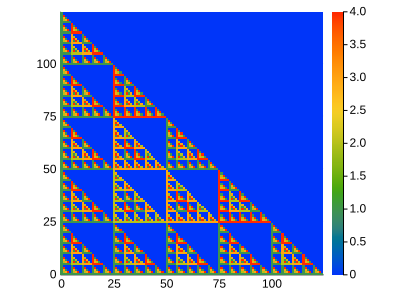

In [12]:
plotbctable(modulo=5, tablesize=124)

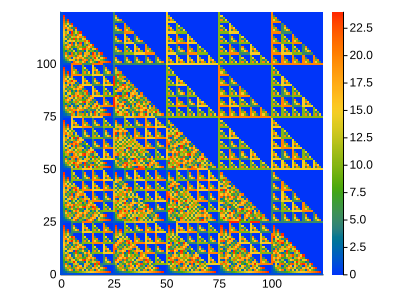

In [13]:
plotbctable(modulo=25, tablesize=124)

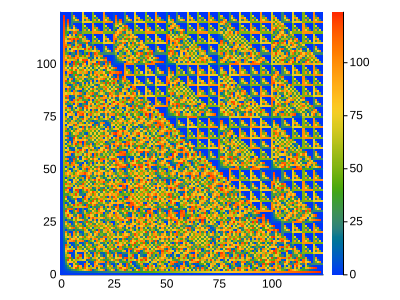

In [14]:
plotbctable(modulo=125, tablesize=124)

### modolo 6, 10, 12, 14, 18

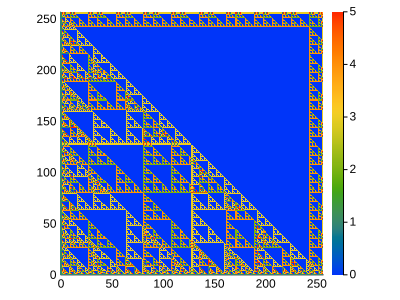

In [15]:
plotbctable(modulo=6, tablesize=2^8)

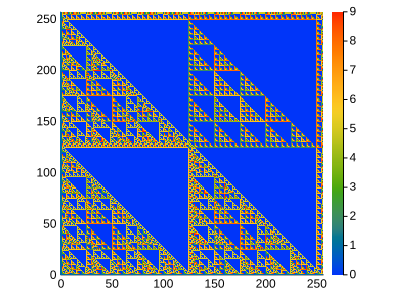

In [16]:
plotbctable(modulo=10, tablesize=2^8)

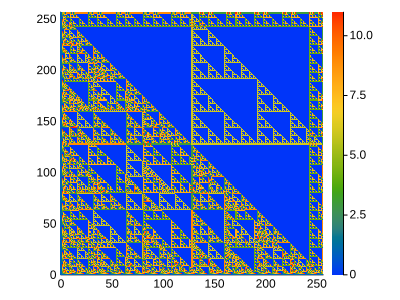

In [17]:
plotbctable(modulo=12, tablesize=2^8)

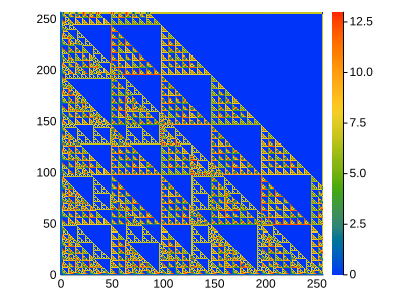

In [18]:
plotbctable(modulo=14, tablesize=2^8)

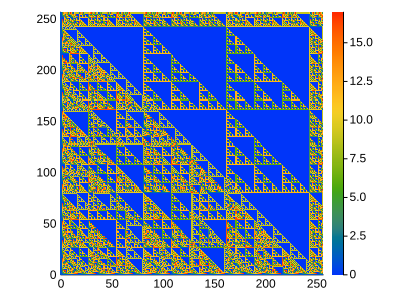

In [19]:
plotbctable(modulo=18, tablesize=2^8)

## Lucasの定理

**Lucasの定理:** $p$ は素数であるとし, $0$ 以上の整数 $n$, $k$ を $0$ 以上 $p$ 未満の整数 $n_i$, $k_i$ 達を使って

$$
\begin{aligned}
&
n = n_0 + n_1p + n_2p^2 + \cdots + n_L p^L, 
\\ &
k = k_0 + k_1p + k_2p^2 + \cdots + k_L p^L 
\end{aligned}
$$

と表すと, 

$$
\binom{n}{k} \equiv \binom{n_0}{k_0}\binom{n_1}{k_1}\cdots\binom{n_L}{k_L} \pmod{p}
$$

が成立している. 

**証明のヒント:** 二項定理と 

$$
(x+y)^p \equiv x^p + y^p \pmod{p}
$$

をまず証明する. そしてこれらをうまく使えば比較的容易に証明できる. どうしても自力で遂行できなければ

* http://integers.hatenablog.com/entry/2016/08/02/230537

を参照せよ. $\QED$

**注意:** Lucasの定理から $n$, $k$ を同時に $p$ 倍しても modulo $p$ で二項係数 $\binom{n}{k}$ が不変になることがわかる. 逆に $n$, $k$ のそれぞれを同時に $p$ で割った商 $(n-n_0)/p$, $(k-k_0)/p$ で置き換えても, 二項係数は $\binom{n_0}{k_0}$ の因子が無くなるだけの変化しないことがわかる. $\QED$

In [20]:
# Lucasの定理の数値的確認

setprecision(256)

function binomial(n,k)
    k < 0 && return zero(n)
    k == 0 && return one(n)
    k > n && return zero(n)
    k > n ÷ 2 && return binomial(n, n-k)
    bc = one(n)
    for j in 1:k
        bc = bc * (n-j+1) ÷ j
    end
    return bc
end

p = 13
ns = BigInt[1, 2, 3, 4]
ks = BigInt[1, 1, 2, 3]
n = sum(ns[i+1]*p^i for i in 0:endof(ns)-1)
k = sum(ks[i+1]*p^i for i in 0:endof(ks)-1)
@show typeof(n), typeof(k)
@show n, k

a = mod(binomial(n,k), p)
b = mod(prod(binomial(ns[i+1], ks[i+1]) for i in 0:endof(ns)-1), p)
c = mod(binomial(p*n,p*k), p)
@show a, b, c

(typeof(n), typeof(k)) = (BigInt, BigInt)
(n, k) = (9322, 6943)
(a, b, c) = (11, 11, 11)


(11, 11, 11)

## 二項係数の漸近挙動

$n$ が十分大きなとき(実際には $n\geqq 5$ 程度ですでに), $n$ の階乗は

$$
n! \sim n^n e^{-n} \sqrt{2\pi n}
$$

でよく近似されていることがよく知られている(Stirlingの公式). 証明の概略については

* http://nbviewer.jupyter.org/github/genkuroki/HighSchoolMath/blob/master/HighSchoolMath.ipynb

の「Stirlingの公式」の節を参照せよ. 近似がうまく行っていることについては以下の計算を見よ.

In [21]:
stirling_approx(n) = n^n * e^(-n) * √(2π*n)
error(x, x₀) = x - x₀            # 誤差
relative_error(x, x₀) = x/x₀ - 1 # 相対誤差

@printf("%2s %10s %13s %13s %13s\n", "n", "n!", "Stirling", "Error", "Rel.Err.")
println("-"^60)
for n in 1:10
    ft = factorial(n)
    s = stirling_approx(n)
    err = error(s, ft)
    relerr = relative_error(s, ft)
    @printf("%2d %10d %13.4f %13.4f %13.4f\n", n, ft, s, err, relerr)
end

 n         n!      Stirling         Error      Rel.Err.
------------------------------------------------------------
 1          1        0.9221       -0.0779       -0.0779
 2          2        1.9190       -0.0810       -0.0405
 3          6        5.8362       -0.1638       -0.0273
 4         24       23.5062       -0.4938       -0.0206
 5        120      118.0192       -1.9808       -0.0165
 6        720      710.0782       -9.9218       -0.0138
 7       5040     4980.3958      -59.6042       -0.0118
 8      40320    39902.3955     -417.6045       -0.0104
 9     362880   359536.8728    -3343.1272       -0.0092
10    3628800  3598695.6187   -30104.3813       -0.0083


実際に計算するときには階乗は簡単に巨大になりすぎるのでその対数 $\log n!$ の近似式

$$
\log n! = n\log n - n + \log\sqrt{2\pi n} + O(1/n)
$$

の方が便利なことが多い.

これを使えば $n$ も $k$ も $n-k$ も大きなときの二項係数の対数 $\log\binom{n}{k}$ の近似値を求めることができる:

$$
\begin{aligned}
\log\binom{n}{k} &= \log n! - \log k! - \log(n-k)!
\\ & \approx
n\log n - n + \log\sqrt{2\pi n}
\\ & -
(k\log k - k + \log\sqrt{2\pi k})
\\ & - 
((n-k)\log(n-k) - (n-k) + \log\sqrt{2\pi(n-k)})
\\ &=
-n\left(\frac{k}{n}\log\frac{k}{n}+\frac{n-k}{n}\log\frac{n-k}{n}\right) -
\log\sqrt{\frac{2\pi k(n-k)}{n}}
\end{aligned}
$$

2つ目の等号で $n\log n=k\log n + (n-k)\log n$ を使った. $n,k,n-k$ が同じ程度の大きさのまま $n$ を大きくすると右辺第1,2項と比較して第3項の値は小さくなる. だから, 大雑把な近似値として右辺第1,2項のみを使うことが考えられる. 実際にどれだけその近似がうまく行っているかを数値計算とプロットで確認してみよう.

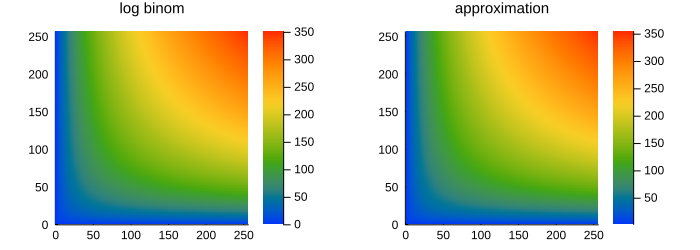

In [22]:
logbinom(n,k) = lgamma(n+1) - lgamma(k+1) - lgamma(n-k+1)
approxlogbinom(n,k) = -n*((k/n)*log(k/n) + (n-k)/n*log((n-k)/n))

lb(x,y) = logbinom(x+y,x)
alb(x,y) = approxlogbinom(x+y,x)

N = 2^8
xs = 0:N
ys = 0:N
P1 = heatmap(xs, ys, lb, title="log binom")
P2 = heatmap(xs, ys, alb, title="approximation")
plot(P1, P2, size=(700, 250))

log binom の方では $\ds\log\binom{x+y}{x}$ をプロットしており, approximation の方では

$$
-(x+y)\left(\frac{x}{x+y}\log\frac{x}{x+y}+\frac{y}{x+y}\log\frac{y}{x+y}\right)
$$

をプロットしている. プロット結果がほとんど同じであり, 近似がかなりうまく行ってそうなことがわかる.

このように, 二項係数の対数のプロットは実質的にその近似のプロットだと思ってよい.

**注意:** 二項係数の桁数のプロットは実質的に二項係数の対数のプロットそのものであることに注意せよ. $\QED$

**発展:** 以上のような話題は実は統計力学における「エントロピー」や情報理論に現われる「情報量」と関係している. エントロピーは情報量の $-1$ 倍に等しい. 上の近似計算の中に出て来た

$$
\frac{k}{n}\log\frac{k}{n}+\frac{n-k}{n}\log\frac{n-k}{n}
$$

は**Shannon情報量**と呼ばれる量の特別な場合になっている. 

このような話題については大学生向けに解説したノート

* https://genkuroki.github.io/documents/20160616KullbackLeibler.pdf

を参照して欲しい. $\QED$

## おまけ：数や階乗や二項係数の一般化

二項係数の一般化として, $q$ 二項係数が有名である. まず数 $x$ を $q$ 数

$$
(x)_q = \frac{1-q^x}{1-q}
$$

に一般化する. 例えば, $n$ が $0$ 以上の整数ならば,

$$
(n)_q = 1+q+q^2+\cdots+q^{n-1}.
$$

これは $q=1$ とおけば $n$ に戻る. そして, $0$ 以上の整数 $n$, $k$ に対して, 階乗 $n!$ と二項係数 $\binom{n}{k}$ を次のように一般化する:

$$
(n)_q! = (1)_q(2)_q\cdots(n)_q, \quad
\binom{n}{k}_q = \frac{(n)_q!}{(k)_q!(n-1)_q!}.
$$

$q\to 1$ の極限でこれらは通常のものに戻る. $q$ 二項係数は次のPascalの三角形を満たしている:

$$
\binom{n+1}{k}_q = \binom{n}{k-1}_q + q^k\binom{n}{k}_q.
$$

そして, 関係式 $yx=qxy$ を仮定すると, 次の $q$ 二項定理も満たしている:

$$
(x+y)^n = \sum_{k=0}^n \binom{n}{k}_q x^k y^{n-k}.
$$

この周辺の数学については次のノートに色々書いてある:

* https://genkuroki.github.io/documents/20060413_q-exp.pdf

実は数の一般化である $q$ 数自体がすでに非常に面白いものになっている. $n$ を $0$ 以上の整数ととし, $q=e^z$ とおき, $q(n)_q$ を $z$ の函数とみなして, $z$ についてべき級数展開すると,

$$
\begin{aligned}
q(n)_q &= \frac{e^z - e^{(n+1)z}}{1-e^z}
\\ &=
n + \frac{n(n+1)}{2}z + \frac{n(n+1)(2n+1)}{6}\frac{z^2}{2} +
\frac{n^2(n+1)^2}{4}\frac{z^3}{3!} 
\\ &+
\frac{n(n+1)(2n+1)(3n^2+3n-1}{30}\frac{z^4}{4!} 
\\ &+
\frac{n^2(n+1)^2(2n^2+2n-1)}{12}\frac{z^5}{5!} + \cdots
\end{aligned}
$$

と $k$ 乗和の公式を知っていれば, 「あっ！」と驚く結果が得られる. 数 $n$ を $q\to 1$ でもとの数に戻る $q(n)_q$ に一般化するとその中に $k$ 乗和の情報がすべて含まれている! この事実の大学生向けの解説が

* http://nbviewer.jupyter.org/github/genkuroki/HighSchoolMath/blob/master/HighSchoolMath.ipynb

の「べき乗和とベルヌイ多項式」の節にある.

パラメーター $q$ を以上のように入れて「すべての数学をやり直す」ことを「$q$ 類似を作る」という. $q$ 類似は20世紀の終わり頃に登場した新しい数学である量子群の理論と関係しており, $q$ 類似についてインターネットで検索すれば様々な情報が見付かるだろう.

In [23]:
z = symbols("z")
n = symbols("n")
g = series((e^z-e^((n+1)*z))/(1-e^z), z, n=10)

  / 2    \      / 3    2     \      / 4    3    2\      /  5    4    3      \ 
  |n    n|    2 |n    n    n |    3 |n    n    n |    4 | n    n    n     n | 
z*|-- + -| + z *|-- + -- + --| + z *|-- + -- + --| + z *|--- + -- + -- - ---| 
  \2    2/      \6    4    12/      \24   12   24/      \120   48   72   720/ 

     /  6     5     4     2 \      /  7      6      5      3         \      / 
   5 | n     n     n     n  |    6 | n      n      n      n       n  |    7 | 
+ z *|--- + --- + --- - ----| + z *|---- + ---- + ---- - ---- + -----| + z *|-
     \720   240   288   1440/      \5040   1440   1440   4320   30240/      \4

  8       7      6       4       2 \      /   9        8       7       5      
 n       n      n       n       n  |    8 |  n        n       n       n       
---- + ----- + ---- - ----- + -----| + z *|------ + ----- + ----- - ----- + --
0320   10080   8640   17280   60480/      \362880   80640   60480   86400   18

 3            \      /   10        9        8    

In [24]:
[factor(g[:coeff](z^k) * factorial(k)) for k in 1:9]

9-element Array{Sym,1}:
                                                              n*(n + 1)/2
                                                    n*(n + 1)*(2*n + 1)/6
                                                          n^2*(n + 1)^2/4
                                 n*(n + 1)*(2*n + 1)*(3*n^2 + 3*n - 1)/30
                                       n^2*(n + 1)^2*(2*n^2 + 2*n - 1)/12
                         n*(n + 1)*(2*n + 1)*(3*n^4 + 6*n^3 - 3*n + 1)/42
                         n^2*(n + 1)^2*(3*n^4 + 6*n^3 - n^2 - 4*n + 2)/24
 n*(n + 1)*(2*n + 1)*(5*n^6 + 15*n^5 + 5*n^4 - 15*n^3 - n^2 + 9*n - 3)/90
           n^2*(n + 1)^2*(n^2 + n - 1)*(2*n^4 + 4*n^3 - n^2 - 3*n + 3)/20